BACKGROUND INFO

There are 10 types of faults, linked to each bearing defect:
    Ball_007_1: Ball defect (0.007 inch)
    Ball_014_1: Ball defect (0.014 inch)
    Ball_021_1: Ball defect (0.021 inch)
    IR_007_1: Inner race fault (0.007 inch)
    IR_014_1: Inner race fault (0.014 inch)
    IR_021_1: Inner race fault (0.021 inch)
    Normal_1: Normal
    OR_007_6_1: Outer race fault (0.007 inch, data collected from 6 O'clock position)
    OR_014_6_1: Outer race fault (0.014 inch, 6 O'clock)
    OR_021_6_1: Outer race fault (0.021 inch, 6 O'clock)
    
Raw data files are in .mat format contained in /raw. Each data file consists of acceleration data of different lengths.

The data is collected from multiple sensors placed at different places. Accelerometers, which were attached to the housing with magnetic bases and placed at the 12 o’clock position at both the DE and FE of the motor bearing, were used for collecting vibration data. Additionally, for some experiments, an accelerometer was attached to the motor supporting base plate too.

Each file contains one or more of the recorded DE (drive-end), FE (fan-end), and BA (base plate) acceleration data. For the drive-end bearing experiments, data was collected at 12k and 48k samples per second. Fan-end data was collected at 12k samples per second. For the normal baseline, the data collection rate was 48k samples per second (Neupane, Seok, 2019). 


In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from scipy.fft import fft, fftfreq
import scipy.io as sio

RAW_FILES = 'raw/'
# RAW_FILES = 'raw/selected_files/'
# SENSOR_NAMES = ['X098_DE_time', 'X098_FE_time', 'X123_DE_time', 'X123_FE_time', 'X190_DE_time', 'X190_FE_time', 'X227_DE_time', 'X227_FE_time',
#                  'X110_DE_time', 'X110_FE_time', 'X175_DE_time', 'X175_FE_time', 'X214_DE_time', 'X214_FE_time',
#                  'X136_DE_time', 'X136_FE_time', 'X202_DE_time', 'X202_FE_time', 'X239_DE_time', 'X239_FE_time']
SENSOR_NAMES = ['X098_FE_time', 'X123_FE_time', 'X190_FE_time', 'X227_FE_time', 
                'X110_FE_time', 'X175_FE_time', 'X214_FE_time', 'X136_FE_time', 
                'X202_FE_time', 'X239_FE_time']
SAMPLING_RATE = 12000 # for FE faults
TIME_STEP = 1 / SAMPLING_RATE

Raw data files import, preprocessing and feature extraction. 

PSD calculation parameters:
Bin width = 1 Hz is achieved by setting npsereg = sampling_rate 
Reference: https://info.endaq.com/hubfs/Plots/enDAQ-Vibration-Monitoring-Metrics-Case-Western-Bearing-Data_2.html#PSD

Analysing file: B007_1_123.mat
Number of sample points in file: 487384


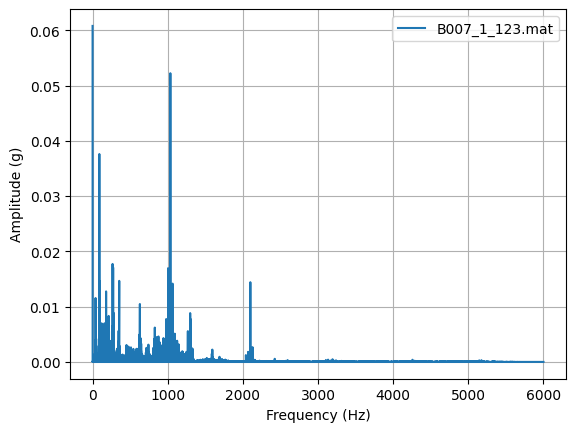

Number of signal segments: 477


c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritem

Analysing file: B014_1_190.mat
Number of sample points in file: 486224


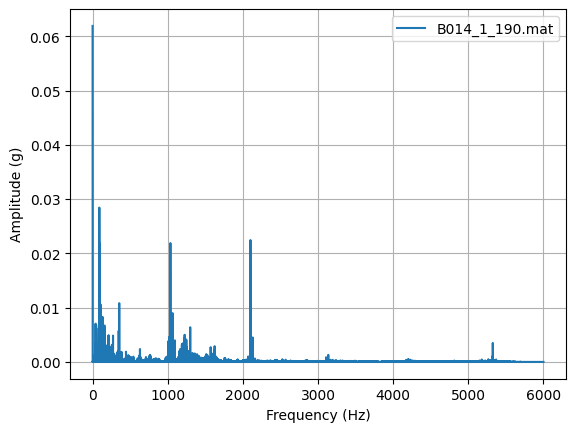

Number of signal segments: 476


c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritem

Analysing file: B021_1_227.mat
Number of sample points in file: 486804


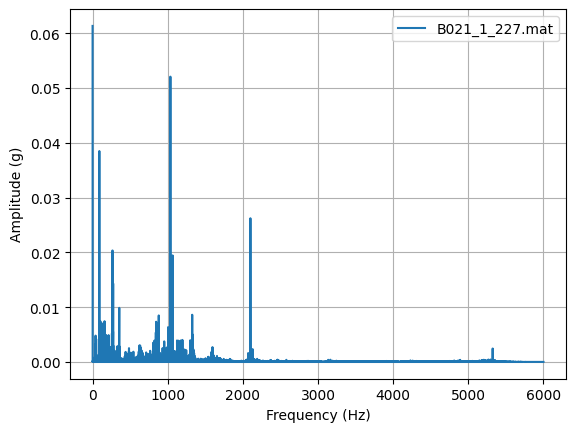

Number of signal segments: 477


c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritem

Analysing file: IR007_1_110.mat
Number of sample points in file: 486224


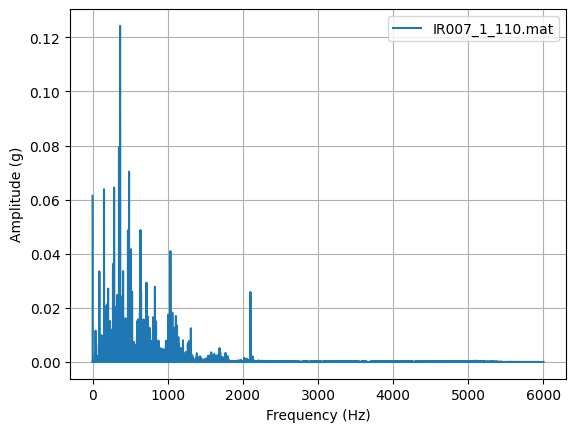

Number of signal segments: 476


c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritem

Analysing file: IR014_1_175.mat
Number of sample points in file: 381890


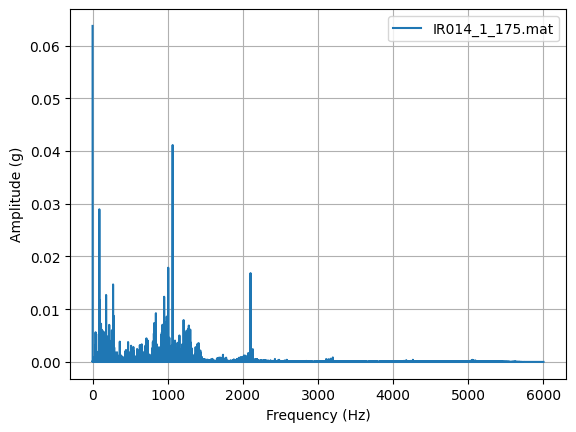

Number of signal segments: 374


c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritem

Analysing file: IR021_1_214.mat
Number of sample points in file: 485063


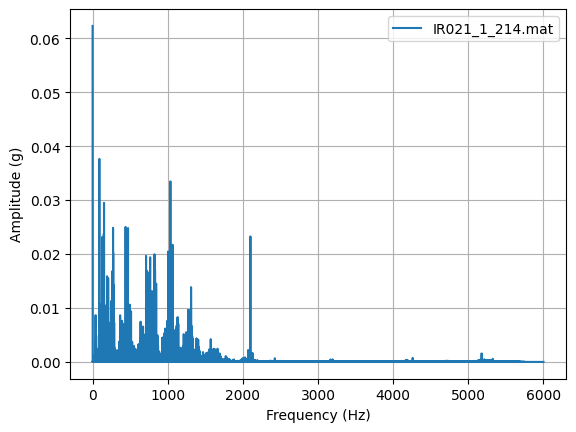

Number of signal segments: 475


c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritem

Analysing file: OR007_6_1_136.mat
Number of sample points in file: 486804


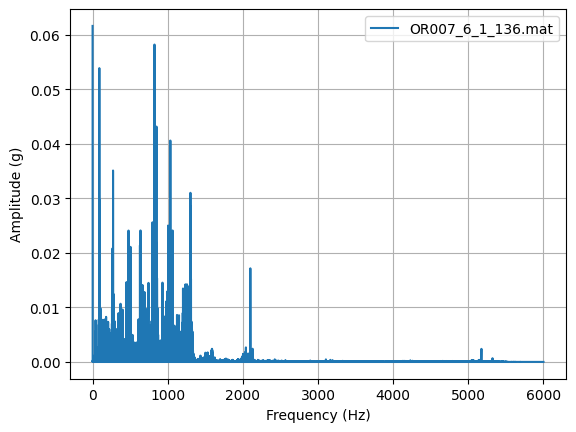

Number of signal segments: 477


c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritem

Analysing file: OR014_6_1_202.mat
Number of sample points in file: 484483


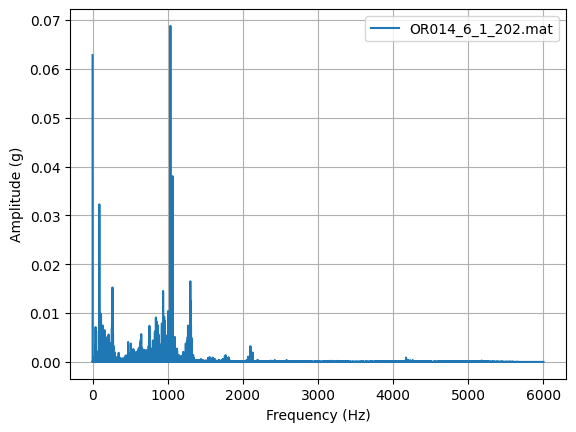

Number of signal segments: 474


c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritem

Analysing file: OR021_6_1_239.mat
Number of sample points in file: 489125


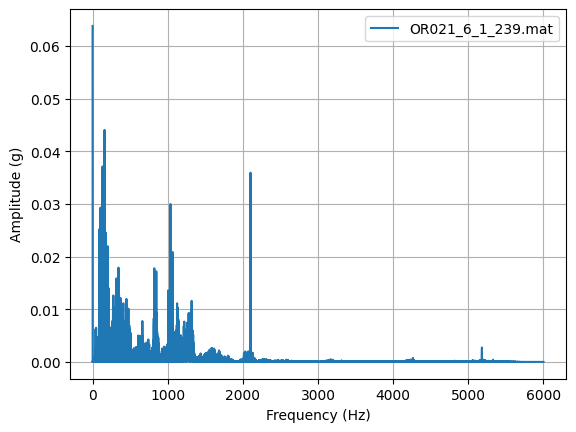

Number of signal segments: 479


c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritem

Analysing file: Time_Normal_1_098.mat
Number of sample points in file: 483903


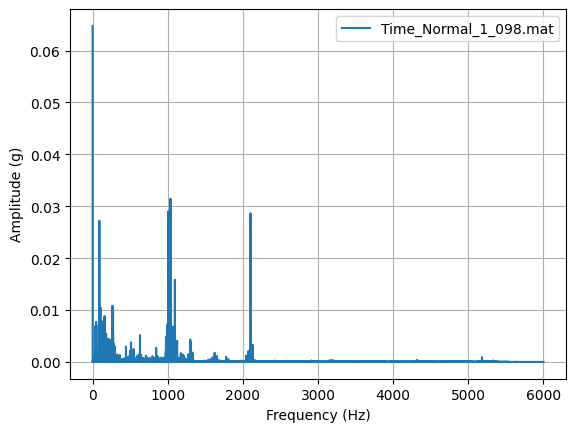

Number of signal segments: 474


c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, column in psd_data.iteritems(): # for each column in dataframe that corresponds to one segment
c:\Users\g.derbysheva\PycharmProjects\vibration_fault_diagnosis\feature_extractor.py:79: FutureWarning: iteritem

In [2]:
from numpy.lib.stride_tricks import sliding_window_view
import plotly.express as px
from feature_extractor import TimeFeatureExtractor, FrequencyFeatureExtractor
from signal_processing_tools import SignalProcessor

BIN_WIDTH = 1  # bin width for PSD calculation (in Hz)

WINDOW_SIZE = 1200  # to divide time series into segments of data points to analyse
OVERLAP_PERCENTAGE = 0.15  
OVERLAP_SIZE = int(WINDOW_SIZE * OVERLAP_PERCENTAGE)
HOP_SIZE = WINDOW_SIZE - OVERLAP_SIZE  # distance between the start of consecutive windows

files = []
frames = []
psd_frames = []
segmented_psd_frames = []
psd_data = pd.DataFrame
segmented_psd_data = pd.DataFrame
labeled_data = pd.DataFrame
plt.figure()  # figure to plot fft


for file in os.listdir(RAW_FILES):
    files.append(file)
    raw_dict = sio.loadmat(RAW_FILES + file)  # load raw data file in .mat format
    for i in range(len(SENSOR_NAMES)):
        sensor = SENSOR_NAMES[i]
        if sensor in raw_dict:
            time_series = raw_dict[sensor].flatten()  # extract time series for one of the accelerometers and convert 2D array to 1D array
            sample_points = len(time_series)
            print('Analysing file: ' + file)
            print('Number of sample points in file: ' + str(sample_points))
            
            processor = SignalProcessor()
            x_fft, y_fft = SignalProcessor.get_fft(data=time_series, sample_points=sample_points, time_step=TIME_STEP)  # FFT transform signal
            plt.plot(x_fft, y_fft, label=file)  # Plot FFT
            plt.grid()
            plt.xlabel('Frequency (Hz)')
            plt.ylabel('Amplitude (g)')
            plt.legend()
            plt.show()

            # Data segmentation
            segmented_signal = sliding_window_view(x=time_series, window_shape=WINDOW_SIZE)[::HOP_SIZE]
            print('Number of signal segments: ' + str(len(segmented_signal)))
                 
            # Extract statistical features form non-normalized time-domain signal segments
            time_extractor = TimeFeatureExtractor()
            time_features = time_extractor.extract_features(segmented_signal)
            time_features['Fault type'] = file[:-10]  # label time domain features with fault type
            frames.append(time_features)

            # Calculate PSD for entire time series for each file
            df_psd = SignalProcessor.get_psd(data=time_series, bin_width=BIN_WIDTH, name=file, sampling_rate=SAMPLING_RATE)
            psd_frames.append(df_psd)
            psd_data = pd.concat(psd_frames, ignore_index=True, axis=1)

            # Calculate PSD for segmented time series
            for i in range(len(segmented_signal)):
                segment = segmented_signal[i]
                df_segmented_psd = SignalProcessor.get_psd(data=segment, bin_width=1, name=file, sampling_rate=WINDOW_SIZE) # use segment window length as sampling rate in this case
                segmented_psd_frames.append(df_segmented_psd)

                # Extract features from PSD frequency spectrum segments
                freq_extractor = FrequencyFeatureExtractor()
                freq_features = freq_extractor.extract_features(df_segmented_psd)
                freq_features['Fault type'] = file[:-10]  # label frequency domain features with fault type
                frames.append(freq_features)

segmented_psd_data = pd.concat(segmented_psd_frames, axis=1) # each column is a PSD segment for a particular file

# combine frequency and time domain features into one labeled dataframe
labeled_data = pd.concat(frames, ignore_index=True)
labeled_data.to_csv('CWRU_preprocessed_labeled.csv', index=False)

psd_data.columns = files
psd_fig = px.line(psd_data, labels={'value': 'Acceleration (g^2/Hz)'}, log_x=True, log_y=True)  # Plot PSD for entire time series for all files
psd_fig.show()

Plot features. 

Processing feature: Standard deviation
Processing feature: Mean
Processing feature: Peak-to-peak factor
Processing feature: RMS
Processing feature: Crest factor
Processing feature: Kurtosis
Processing feature: Skewness
Processing feature: peak_frequency
Processing feature: peak_amplitude
Processing feature: rms_low_frequency
Processing feature: rms_mid_frequency
Processing feature: rms_high_frequency
Processing feature: rms_overall


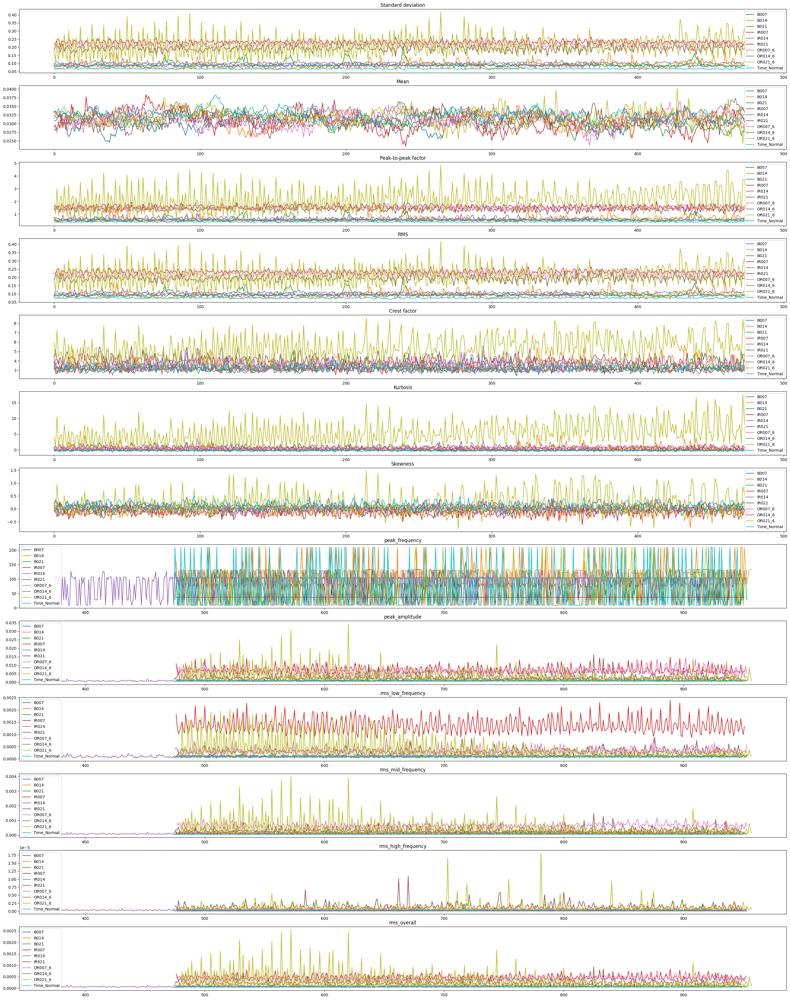

In [3]:
TARGET = 'Fault type'
FEATURES_LIST = list(labeled_data.columns)
FEATURES_LIST.remove(TARGET)

figure, axis = plt.subplots(len(FEATURES_LIST), 1, figsize=(35, 45))

for index, feature_name in enumerate(FEATURES_LIST):  # for index, value in list of features
    print(f"Processing feature: {feature_name}")
    for class_value in labeled_data[TARGET].unique():  # for each fault type/class
        filtered_df = labeled_data[labeled_data[TARGET] == class_value].reset_index(drop=True)
        if filtered_df.empty:
            print(f"No data found for class {class_value} in feature {feature_name}")
            continue
        axis[index].plot(filtered_df[feature_name], label=class_value)
        axis[index].set_title(feature_name)
        axis[index].legend()

Encode categorical target.

In [4]:
from sklearn.preprocessing import TargetEncoder

TARGET = 'Fault type'
ENCODED_TARGET = 'Encoded fault type'

TIME_FEATURE_COLUMNS = [
            'Standard deviation', 
            'Mean', 
            'Peak-to-peak factor', 
            'RMS', 
            'Crest factor', 
            'Kurtosis', 
            'Skewness',
            'Fault type'
            ]

FREQUENCY_FEATURE_COLUMNS = [
            'peak_frequency',
            'peak_amplitude',
            'rms_low_frequency',
            'rms_mid_frequency',
            'rms_high_frequency',
            'rms_overall',
            'Fault type'
            ]

NFEATURES = 3 # number of features to select
selection_results = []

# Split dataframe into time and frequency domain features
time_features_data = labeled_data[TIME_FEATURE_COLUMNS]
freq_features_data = labeled_data[FREQUENCY_FEATURE_COLUMNS]

feature_frames = [time_features_data, freq_features_data]
encoded_feature_frames = []

for frame in feature_frames:
    frame = frame.dropna().reset_index(drop=True) # Get rid of rows with NaN values and reindex
    frame[ENCODED_TARGET] = pd.Categorical(frame[TARGET]).codes # Encode fault type
    encoded_feature_frames.append(frame)

Calculate feature correlation.

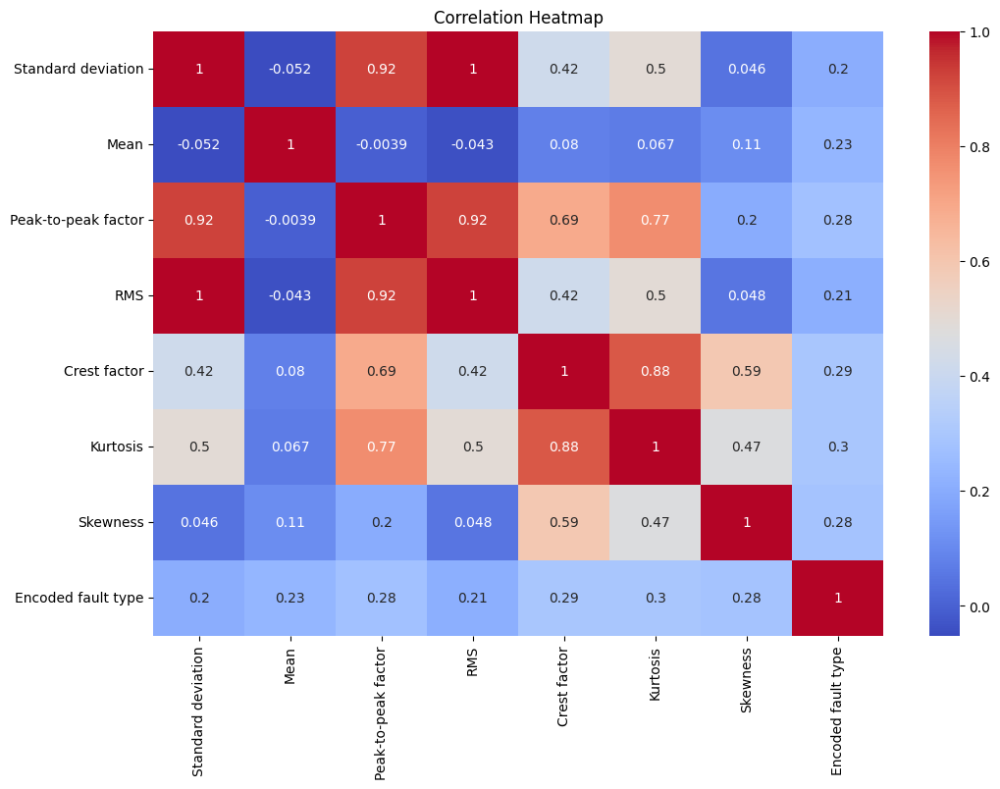

Selected features and scores using correlation: [('Kurtosis', 0.2965914133379882), ('Crest factor', 0.29426865938592917), ('Skewness', 0.28407681583912886)]


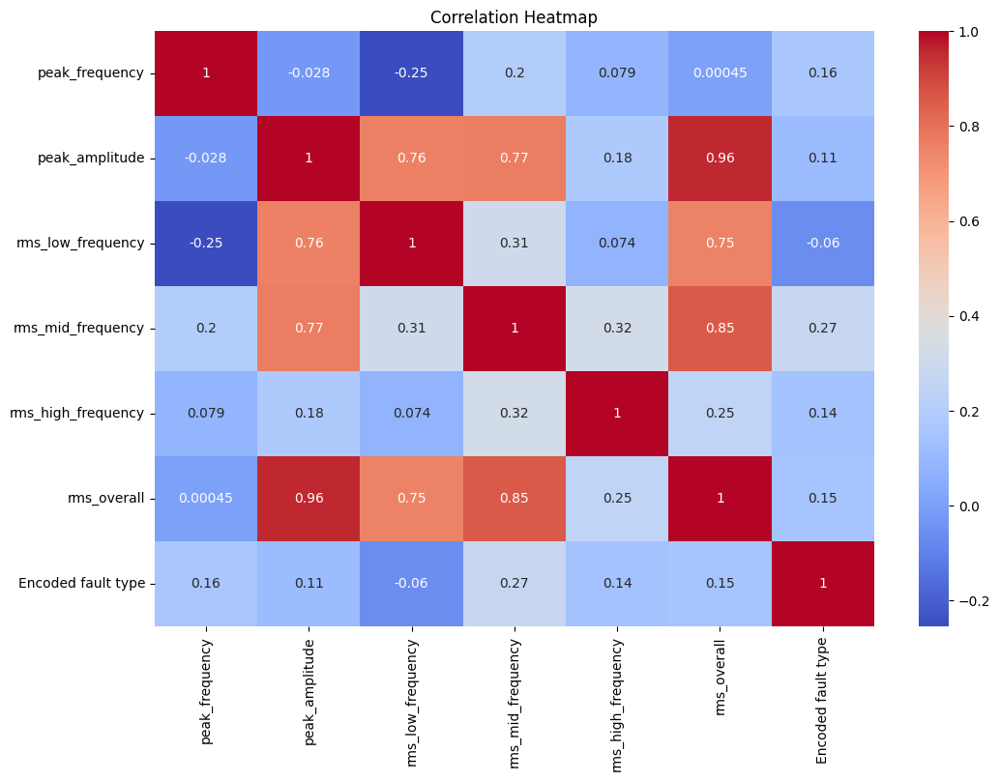

Selected features and scores using correlation: [('rms_mid_frequency', 0.2699118549942603), ('peak_frequency', 0.15901338962394773), ('rms_overall', 0.14986039596197517)]


In [5]:
"""Perform feature selection with correlation analysis."""
import seaborn as sns
from feature_selector import select_features

for frame in encoded_feature_frames:
    correlation_matrix = frame.corr(method='pearson', numeric_only=True)  # numeric_only=True to ignore original non-numeric target column
    # Visualize correlation heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
    plt.title('Correlation Heatmap')
    plt.show()

    selected_features = select_features(score_data=correlation_matrix, nfeatures=NFEATURES, target_name=ENCODED_TARGET)
    print(f'Selected features and scores using correlation: {selected_features}')

    for feature in selected_features:
        selection_results.append(feature[0])  # add selected feature names to list


Calculate predictive power score.

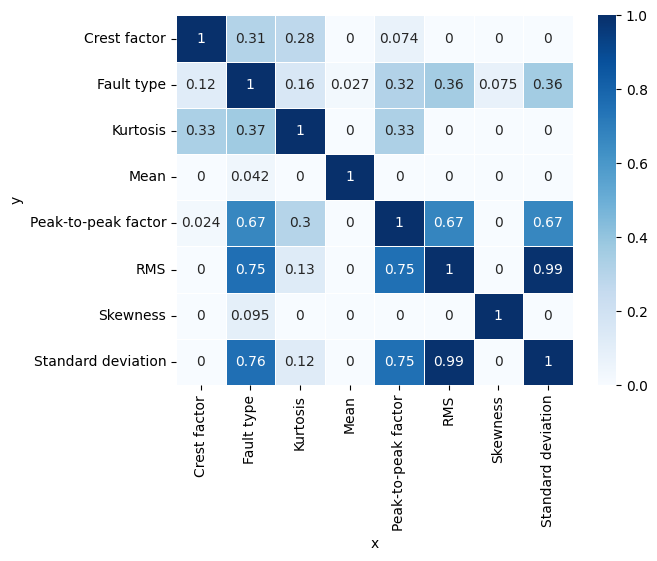

Selected features and scores using ppscore: [('Standard deviation', 0.7553198749040991), ('RMS', 0.7543195156754098), ('Peak-to-peak factor', 0.667503854109029)]


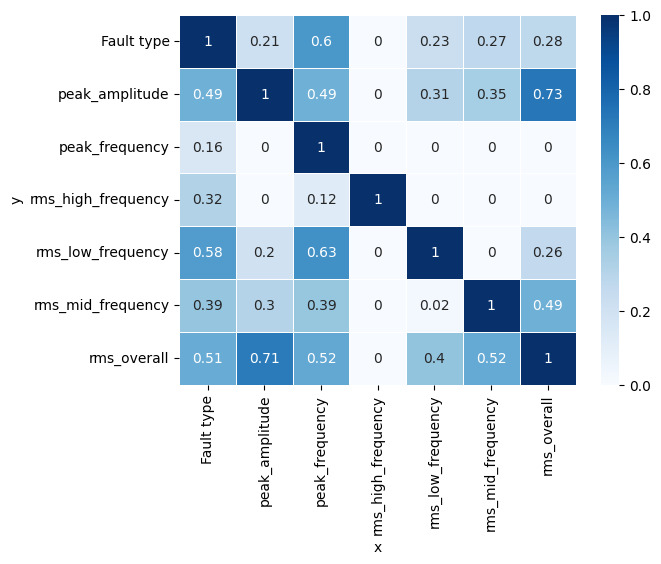

Selected features and scores using ppscore: [('rms_low_frequency', 0.579060276749471), ('rms_overall', 0.5116193433020093), ('peak_amplitude', 0.48950655558979117)]


In [6]:
"""Perform feature selection with PPScore."""
import ppscore as pps

for frame in encoded_feature_frames:
    # Visualizes ppscore matrix for time features
    matrix_df = pps.matrix(frame.drop(ENCODED_TARGET, axis=1))[['x', 'y', 'ppscore']].pivot(columns='x', index='y', values='ppscore')
    plt.figure()
    sns.heatmap(matrix_df, vmin=0, vmax=1, cmap='Blues', linewidths=0.5, annot=True)
    plt.show()

    # Select features based on the ppscore
    selected_features = select_features(score_data=matrix_df, nfeatures=NFEATURES, target_name=TARGET)
    print(f'Selected features and scores using ppscore: {selected_features}')

    for feature in selected_features:
        selection_results.append(feature[0])  # add selected feature names to list

Univariate feature selection works by selecting the best features based on univariate statistical tests (reference https://scikit-learn.org/stable/modules/feature_selection.html#univariate-feature-selection).

In [7]:
from sklearn.feature_selection import f_classif, SelectKBest

for frame in encoded_feature_frames:
    x = frame.drop(ENCODED_TARGET, axis=1)
    x = x.drop(TARGET, axis=1)
    y = frame[ENCODED_TARGET]

    feature_selector = SelectKBest(f_classif, k=NFEATURES)
    x_new = feature_selector.fit_transform(x, y)  # select top 3 features using ANOVA F-test
    selected_features = x.columns[feature_selector.get_support()]
    print(f'Selected features using K best selector: {selected_features}')

    for feature in selected_features:
        selection_results.append(feature)  # add selected feature names to list

Selected features using K best selector: Index(['Standard deviation', 'Peak-to-peak factor', 'RMS'], dtype='object')
Selected features using K best selector: Index(['peak_amplitude', 'rms_low_frequency', 'rms_overall'], dtype='object')


Make training data with selected features. 

In [8]:
unique_results = []
for feature in selection_results:
    if feature not in unique_results:
        unique_results.append(feature)
        
print(f'Selected unique features: {unique_results}')

unique_feature_frames = []
for frame in encoded_feature_frames:
    columns = []
    for feature in unique_results:
        if feature in frame.columns:
            columns.append(feature)
    frame = frame[columns]
    unique_feature_frames.append(frame)

train_df = pd.concat(unique_feature_frames, axis=1)
train_df[ENCODED_TARGET] = encoded_feature_frames[0][ENCODED_TARGET]
train_df[TARGET] = encoded_feature_frames[0][TARGET]
train_df.to_csv('CWRU_train.csv', index=False)

Selected unique features: ['Kurtosis', 'Crest factor', 'Skewness', 'rms_mid_frequency', 'peak_frequency', 'rms_overall', 'Standard deviation', 'RMS', 'Peak-to-peak factor', 'rms_low_frequency', 'peak_amplitude']


REFERENCES
D. Neupane and J. Seok, "Bearing Fault Detection and Diagnosis Using Case Western Reserve University Dataset With Deep Learning Approaches: A Review," in IEEE Access, vol. 8, pp. 93155-93178, 2020, doi: 10.1109/ACCESS.2020.2990528.

https://www.kaggle.com/datasets/brjapon/cwru-bearing-datasets/data

(Neupane, Seok, 2019)

https://info.endaq.com/hubfs/Plots/enDAQ-Vibration-Monitoring-Metrics-Case-Western-Bearing-Data_2.html#PSD

https://www.mdpi.com/2079-9292/12/18/3971#sec3dot2dot1-electronics-12-03971 